<a href="https://colab.research.google.com/github/CyWP/C473_F23/blob/main/473_Final_BVG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Banishing the Vanishing Gradient
*COMP 473/6731-DD | Final Project | Prof. Adam Krzyzak \
 Raymand Shojaie  40258477 | Thomas Peschlow 40190020 | Santiago Buitrago 40291569* \
 \
 This is the implementation file for our final project for COMP 473/6731: Pattern Recognition.\
 The following notebook includes implementation and analysis of two separate neural network architectures with the goal of highlighting the use of skip layers/residual blocks as an answer to the vanishing gradient problem using the CIFAR-10 dataset.



#User Manual
In order to run this notebook, we recommend you run the code blocks in the following order:\
\
**1. Dependencies/Data Preparation**\
[ [Import libraries](#scrollTo=HIXplIF16TNO&line=12&uniqifier=1) ] [ [Load Dataset](#scrollTo=-5PLl_KN8ZhO&line=6&uniqifier=1) ]\
**2. Train Models**\
*Vgg-16* [ [Load Model](#scrollTo=e_stb7re6VvN&line=9&uniqifier=1) ] [ [Training Loop](#scrollTo=ezmtNf318qF5&line=4&uniqifier=1) ]\
*Residual Network* [ [Load Model](#scrollTo=cWErec0N9DuP&line=6&uniqifier=1) ] [ [Training Loop](#scrollTo=gwynjhnFh28u&line=1&uniqifier=1) ]\
**3. Plots**\
*Vgg-16* [ [Accuracy/Loss](#scrollTo=9mNTQA_pSB9n&line=9&uniqifier=1) ] [ [Confusion Matrix](#scrollTo=VTuAdyJC5Cjs&line=9&uniqifier=1) ]\
*Residual Network* [ [Accuracy/Loss](#scrollTo=9mNTQA_pSB9n&line=10&uniqifier=1) ] [ [Confusion Matrix](#scrollTo=VTuAdyJC5Cjs&line=9&uniqifier=1) ]\
**4. Layer Visualization**\
*Vgg-16* [ [epoch 5](#scrollTo=gpGjncxcWRZj&line=7&uniqifier=1) ] [ [epoch 10](#scrollTo=RkGDuWkWWOJU&line=7&uniqifier=1) ] [ [epoch 15](#scrollTo=gsdfQIZ8WBVy&line=6&uniqifier=1) ] [ [epoch 20](#scrollTo=KbWDiQETVi5L&line=11&uniqifier=1) ] [ [epoch 25](#scrollTo=zgww70du6z9M&line=6&uniqifier=1) ]\
*Resdiual Network* [ [epoch 5](#scrollTo=6KxLTRS7udIZ&line=8&uniqifier=1) ] [ [epoch 10](#scrollTo=Keq3HC5G4E9D&line=7&uniqifier=1) ] [ [epoch 15](#scrollTo=wFmd_Nw34ImM&line=10&uniqifier=1) ] [ [epoch 20](#scrollTo=ObLoCnb34MyO&line=19&uniqifier=1) ] [ [epoch 25](#scrollTo=gXj3MKzZuOIS&line=3&uniqifier=1) ]\
**5. Weight Variance Analysis**\
*The link below leads to the model weights of the last epoch of our previous training run. Start by adding these files to your own Google Drive in a directory path "MyDrive/Models".* [ [Layer Weights](https://drive.google.com/drive/folders/1T4QC-4Wv2E19TO-QLB59265uBOFInmED) ] \
[ [Load Data](#scrollTo=xU8FmuRXb2LE&line=7&uniqifier=1) ] [ [Compute](#scrollTo=PsOg57_t4W9j&line=6&uniqifier=1)] [ [Plot](#scrollTo=yGRj7OvFjS90&line=9&uniqifier=1) ]

#Navigation
**General**\
[Import Libraries](#scrollTo=HIXplIF16TNO&line=12&uniqifier=1)\
[Load Data](#scrollTo=-5PLl_KN8ZhO&line=10&uniqifier=1)\
[Weigth Variance Analysis](#scrollTo=xU8FmuRXb2LE&line=4&uniqifier=1)\
\
**Vgg-16**\
[Architecture](#scrollTo=e_stb7re6VvN&line=9&uniqifier=1)\
[Training/Hyperparameters](#scrollTo=ezmtNf318qF5&line=7&uniqifier=1)\
[Accuracy/Loss](#scrollTo=9mNTQA_pSB9n&line=10&uniqifier=1)\
[Confusion Matrix](#scrollTo=VTuAdyJC5Cjs&line=9&uniqifier=1)\
Layer visualizaton [epoch 5](#scrollTo=gpGjncxcWRZj&line=7&uniqifier=1) | [epoch 10](#scrollTo=RkGDuWkWWOJU&line=7&uniqifier=1) | [epoch 15](#scrollTo=gsdfQIZ8WBVy&line=6&uniqifier=1) | [epoch 20](#scrollTo=KbWDiQETVi5L&line=11&uniqifier=1) | [epoch 25](#scrollTo=zgww70du6z9M&line=6&uniqifier=1)\
\
**Residual Network**\
[Architecture](#scrollTo=cWErec0N9DuP&line=6&uniqifier=1)\
[Training/Hyperparameters](#scrollTo=gwynjhnFh28u&line=1&uniqifier=1)\
[Accuracy/Loss](#scrollTo=HIvAuCEvtsBw&line=25&uniqifier=1)\
[Confusion Matrix](#scrollTo=PxxVppoP51Dl&line=25&uniqifier=1)\
Layer visualizaton [epoch 5](#scrollTo=6KxLTRS7udIZ&line=8&uniqifier=1) | [epoch 10](#scrollTo=Keq3HC5G4E9D&line=7&uniqifier=1) | [epoch 15](#scrollTo=wFmd_Nw34ImM&line=10&uniqifier=1) | [epoch 20](#scrollTo=ObLoCnb34MyO&line=19&uniqifier=1) | [epoch 25](#scrollTo=gXj3MKzZuOIS&line=3&uniqifier=1)


In [ ]:
# Imports
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.rcsetup import validate_bbox
from matplotlib.lines import Line2D
from google.colab import drive
import numpy as np
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
import torch.optim as optim
import torchvision.transforms as transforms
from sklearn.manifold import TSNE
import torchvision
import torchvision.transforms as transforms
device = "cuda" if torch.cuda.is_available() else "cpu"

# Fixed random seed, easier for testing
torch.manual_seed(0)
torch.cuda.manual_seed_all(0)
torch.cuda.manual_seed(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)
#Vgg-16
The following block includes basic implementation of a Vgg-16 neural network architecture.\
Convolutional Layers: 13\
Convolution Kernel Size: 3\
Convolution Kernel Stride: 1\
Max Pooling Layers: 5\
Max Pooling Kernel Size: 2\
Max Pooling Kernel Stride: 2\
Fully Connected Layers: 3


In [ ]:
class VGG16(nn.Module):
  """This class implements the VGG-16 architecture in PyTorch"""

  def __init__(self, activation_str="relu"):
    """
      Constructor for the VGG16 class.

      activation_str: string, default "relu"
        Activation function to use.
    """
    super(VGG16, self).__init__()

    self.n_classes = 10
    self.activation_str = activation_str
    # self.initialization = initialization

    self.conv_layer_1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1,stride=1)
    self.conv_layer_2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1)
    self.conv_layer_3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
    self.conv_layer_4 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1)
    self.conv_layer_5 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1)
    self.conv_layer_6 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1)
    self.conv_layer_7 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1)
    self.conv_layer_8 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1)
    self.conv_layer_9 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)
    self.conv_layer_10 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)
    self.conv_layer_11 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)
    self.conv_layer_12 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)
    self.conv_layer_13 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)


    # Add 2D batch normalization after every convolutional layer
    self.conv_layer_1_bn = nn.BatchNorm2d(64)
    self.conv_layer_2_bn = nn.BatchNorm2d(64)
    self.conv_layer_3_bn = nn.BatchNorm2d(128)
    self.conv_layer_4_bn = nn.BatchNorm2d(128)
    self.conv_layer_5_bn = nn.BatchNorm2d(256)
    self.conv_layer_6_bn = nn.BatchNorm2d(256)
    self.conv_layer_7_bn = nn.BatchNorm2d(256)
    self.conv_layer_8_bn = nn.BatchNorm2d(512)
    self.conv_layer_9_bn = nn.BatchNorm2d(512)
    self.conv_layer_10_bn = nn.BatchNorm2d(512)
    self.conv_layer_11_bn = nn.BatchNorm2d(512)
    self.conv_layer_12_bn = nn.BatchNorm2d(512)
    self.conv_layer_13_bn = nn.BatchNorm2d(512)

    self.max_pool_layer_1 = nn.MaxPool2d(kernel_size=2, stride=2)
    self.max_pool_layer_2 = nn.MaxPool2d(kernel_size=2, stride=2)
    self.max_pool_layer_3 = nn.MaxPool2d(kernel_size=2, stride=2)
    self.max_pool_layer_4 = nn.MaxPool2d(kernel_size=2, stride=2)
    self.max_pool_layer_5 = nn.MaxPool2d(kernel_size=2, stride=2)


    self.fc_1 = nn.Linear(512*7*7, 4096)
    self.fc_2 = nn.Linear(4096, 4096)
    self.fc_3 = nn.Linear(4096, self.n_classes)

    # Initialize the weights of each trainable layer of your network using xavier_uniform initialization
    for m in self.modules():
        if isinstance(m, nn.Conv2d):
            init.xavier_uniform_(m.weight)
        elif isinstance(m, nn.Linear):
            init.xavier_uniform_(m.weight)

  def activation(self, input):
    """
      input: Tensor input on which the activation is applied.
      Output: Result of activation function applied on input.
        E.g. if self.activation_str is "relu", return relu(input).
    """
    if self.activation_str == "relu":
      return F.relu(input)
    elif self.activation_str == "tanh":
      return torch.tanh(input)
    else:
      raise Exception("Invalid activation")
    return 0

  def get_first_conv_layer_filters(self):
    """
      Outputs: Returns the filters in the first convolution layer.
    """
    return self.conv_layer_1.weight.clone().cpu().detach().numpy()

  def get_last_conv_layer_filters(self):
    """
      Outputs: Returns the filters in the last convolution layer.
    """
    return self.conv_layer_13.weight.clone().cpu().detach().numpy()

  def forward(self, x):
    """
      x: Tensor input to the network.
      Outputs: Returns the output of the forward pass of the network.
    """
    x = self.conv_layer_1_bn(self.conv_layer_1(x))
    x = self.activation(x)
    x = self.conv_layer_2_bn(self.conv_layer_2(x))
    x = self.activation(x)
    x = self.max_pool_layer_1(x)

    x = self.conv_layer_3_bn(self.conv_layer_3(x))
    x = self.activation(x)
    x = self.conv_layer_4_bn(self.conv_layer_4(x))
    x = self.activation(x)
    x = self.max_pool_layer_2(x)

    x = self.conv_layer_5_bn(self.conv_layer_5(x))
    x = self.activation(x)
    x = self.conv_layer_6_bn(self.conv_layer_6(x))
    x = self.activation(x)
    x = self.conv_layer_7_bn(self.conv_layer_7(x))
    x = self.activation(x)
    x = self.max_pool_layer_3(x)

    x = self.conv_layer_8_bn(self.conv_layer_8(x))
    x = self.activation(x)
    x = self.conv_layer_9_bn(self.conv_layer_9(x))
    x = self.activation(x)
    x = self.conv_layer_10_bn(self.conv_layer_10(x))
    x = self.activation(x)
    x = self.max_pool_layer_4(x)

    x = self.conv_layer_11_bn(self.conv_layer_11(x))
    x = self.activation(x)
    x = self.conv_layer_12_bn(self.conv_layer_12(x))
    x = self.activation(x)
    x = self.conv_layer_13_bn(self.conv_layer_13(x))
    x = self.activation(x)
    x = self.max_pool_layer_5(x)

    x = x.view(x.size(0), -1)
    x = self.activation(self.fc_1(x))
    x = self.activation(self.fc_2(x))
    x = self.fc_3(x)
    x = F.softmax(x, dim=1)

    return x

[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)
#CIFAR-10
This code block defines the loading, training and testing of the CIFAR-10 datset.

In [ ]:
def get_cifar10():
  normalize = transforms.Normalize(
      mean=[0.4914, 0.4822, 0.4465],
      std=[0.2023, 0.1994, 0.2010],
  )

  # define transforms
  transform = transforms.Compose([
          transforms.Resize((227,227)),
          transforms.ToTensor(),
          normalize,
  ])

  train_dataset = torchvision.datasets.CIFAR10(
      root='./data', train=True, download=True, transform=transform)
  train_loader = torch.utils.data.DataLoader(
      train_dataset, batch_size=64, shuffle=True, num_workers=2)

  val_dataset = torchvision.datasets.CIFAR10(
      root='./data', train=False, download=True, transform=transform)
  val_loader = torch.utils.data.DataLoader(
      val_dataset, batch_size=64, shuffle=False, num_workers=2)

  return train_loader, val_loader

def train_loop(epoch, model, train_loader, criterion, optimizer):
    """
    epoch: int
      Number of the current training epoch (starting from 0).
    model: VGG16
      The model to train, which is an instance of the VGG16 class.
    train_loader: DataLoader
      The training dataloader.
    criterion: Module
      A Module object that evaluates the crossentropy loss.
    optimizer: Optimizer
      An Optimizer object for the Adam optimizer.

    Outputs: Returns average train_acc and train_loss for the current epoch.
    """
    train_acc = 0.
    train_loss = 0.

    model.train()
    n = int(0)


    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)

        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        _, predicted = outputs.max(1)
        train_acc += predicted.eq(targets).sum().item()
        train_loss += loss.item()
        n += len(targets)  # Increment 'n' by the length of targets

    train_acc = train_acc / n
    train_loss = train_loss / n

    print(f"Epoch: {epoch} | Train Acc: {train_acc:.6f} | Train Loss: {train_loss:.6f}")


    return train_acc, train_loss

def valid_loop(epoch, model, val_loader, criterion):
  """
    epoch: int
      Number of the current epoch (starting from 0).
    model: VGG16
      The model to train, which is an instance of the VGG16 class.
    val_loader: DataLoader
      The validation dataloader.
    criterion: Module
      A Module object that evaluates the crossentropy loss.

    Outputs: Returns average val_acc and val_loss for the current epoch.
  """
  val_acc = 0.
  val_loss = 0.

  model.eval()
  n=int(0)
  with torch.no_grad():
    for inputs, targets in val_loader:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = model(inputs)
        loss = criterion(outputs, targets)

        _, predicted = outputs.max(1)
        val_acc += predicted.eq(targets).sum().item()
        val_loss += loss.item()
        n=n+len(targets)
  val_acc=val_acc/n
  val_loss=val_loss/n

  print(f"Epoch: {epoch} | Val Acc: {val_acc:.6f}   | Val Loss: {val_loss:.6f}")
  return val_acc, val_loss

[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)
#Training
Training and validation block, also documents accuracy and loss through time for eventual plotting. Due to resource restraints, we have trained the model for 25 epochs.\
Activation function: ReLu\
Weight initialization: Xavier Normal\
*Initial weights normally distributed with mean 0 and variance being inversely linear to the number of inputs and outputs.*\
Optimizer: AdamW\
*Weight decay is a useful way to accelerate illustration of vanishing gradients within layer activation.*\
Batch Size: 64 \
*Stochastic approach is considered superior when using the AdamW optimizer*\
Learning rate = 0.001\
Momentum = 0.9

In [ ]:
if __name__ == "__main__":
  activation_str = "relu"
  initialization = "xavier_normal"
  train_accs, train_losses, val_accs, val_losses = [], [], [], []
  n_epochs = 25
  epoch_grads = []


  model = VGG16(
    activation_str=activation_str,

  ).to(device)
  criterion = nn.CrossEntropyLoss()
  optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

  train_loader, val_loader = get_cifar10()

  for epoch in range(n_epochs):
    # Training
    train_acc, train_loss = train_loop(epoch, model, train_loader, criterion, optimizer)
    train_accs.append(train_acc)
    train_losses.append(train_loss)

    # Validation
    val_acc, val_loss = valid_loop(epoch, model, val_loader, criterion)
    val_accs.append(val_acc)
    val_losses.append(val_loss)
    if (epoch + 1) % 5 == 0:
      torch.save(model.state_dict(), f'model_weights_epoch_{epoch+1}.pth')


100%|██████████| 170498071/170498071 [00:05<00:00, 30074847.28it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified
Epoch: 0 | Train Acc: 0.394660 | Train Loss: 0.032350
Epoch: 0 | Val Acc: 0.462400   | Val Loss: 0.031395
Epoch: 1 | Train Acc: 0.506300 | Train Loss: 0.030590
Epoch: 1 | Val Acc: 0.535900   | Val Loss: 0.030269
Epoch: 2 | Train Acc: 0.564820 | Train Loss: 0.029689
Epoch: 2 | Val Acc: 0.563600   | Val Loss: 0.029796
Epoch: 3 | Train Acc: 0.606080 | Train Loss: 0.029057
Epoch: 3 | Val Acc: 0.600700   | Val Loss: 0.029249
Epoch: 4 | Train Acc: 0.641580 | Train Loss: 0.028498
Epoch: 4 | Val Acc: 0.604300   | Val Loss: 0.029155
Epoch: 5 | Train Acc: 0.672520 | Train Loss: 0.028039
Epoch: 5 | Val Acc: 0.634800   | Val Loss: 0.028685
Epoch: 6 | Train Acc: 0.699400 | Train Loss: 0.027632
Epoch: 6 | Val Acc: 0.648900   | Val Loss: 0.028478
Epoch: 7 | Train Acc: 0.721440 | Train Loss: 0.027289
Epoch: 7 | Val Acc: 0.650800   | Val Loss: 0.028421
Epoch: 8 | Train Acc: 0.741480 | Train Loss: 0.026977
Epoch: 8 

[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)\
Accuracy and Loss plots for the previous training block

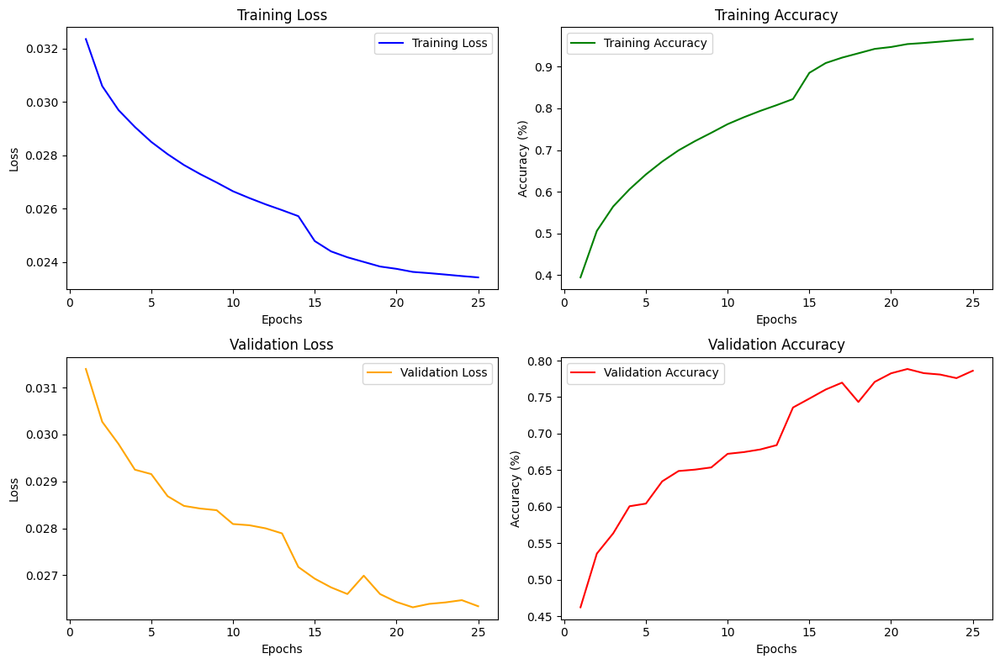

In [ ]:
epochs=np.arange(1, 26)
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(epochs, train_losses, label='Training Loss', color='blue')
plt.title('Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.subplot(2, 2, 2)
plt.plot(epochs, train_accs, label='Training Accuracy', color='green')
plt.title('Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.subplot(2, 2, 3)
plt.plot(epochs, val_losses, label='Validation Loss', color='orange')
plt.title('Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.subplot(2, 2, 4)
plt.plot(epochs, val_accs, label='Validation Accuracy', color='red')
plt.title('Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.tight_layout()
plt.show()


Visualization of the convolution filters of the previous training block

In [ ]:
def visualize_filters(filters, n=6):

    f_min, f_max = filters.min(), filters.max()
    filters = (filters - f_min) / (f_max - f_min)
    fig, axes = plt.subplots(1, n, figsize=(15, 3))

    for i, ax in enumerate(axes):
        cax = ax.imshow(filters[i], cmap='gray')
        ax.axis('off')
        fig.colorbar(cax, ax=ax, orientation='vertical', fraction=0.045, pad=0.04)

    plt.show()

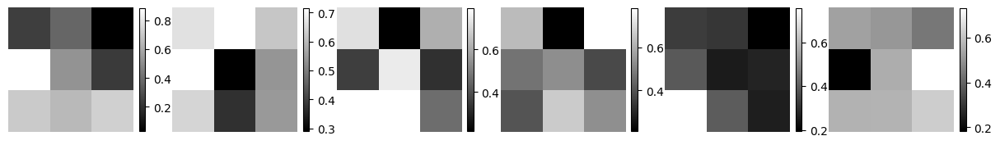

In [ ]:
visualize_filters(model.get_first_conv_layer_filters()[:,0,:,:])

[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)
#Layer Visualization
We have saved all layer weights at epochs 5, 10, 15, 20, 25 in order to visualize the evolution of their activation outputs.

In [ ]:
if __name__ == "__main__":
  vis_image = None
  for data, labels in val_loader:
    vis_image = data[12].unsqueeze(0)
    break
vis_image.shape

torch.Size([1, 3, 227, 227])

In [ ]:
activations = {}

def register_hook(layer, layer_name):
    def hook(module, input, output):
        activations[layer_name] = output
    return hook
vgg_model = model
vgg_model.conv_layer_1.register_forward_hook(register_hook(vgg_model.conv_layer_1, 'first_conv_layer'))
vgg_model.conv_layer_13.register_forward_hook(register_hook(vgg_model.conv_layer_13, 'last_conv_layer'))

In [ ]:
img_tensor = vis_image.to(device)
with torch.no_grad():
    _ = vgg_model(img_tensor)


[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)\
epoch 25

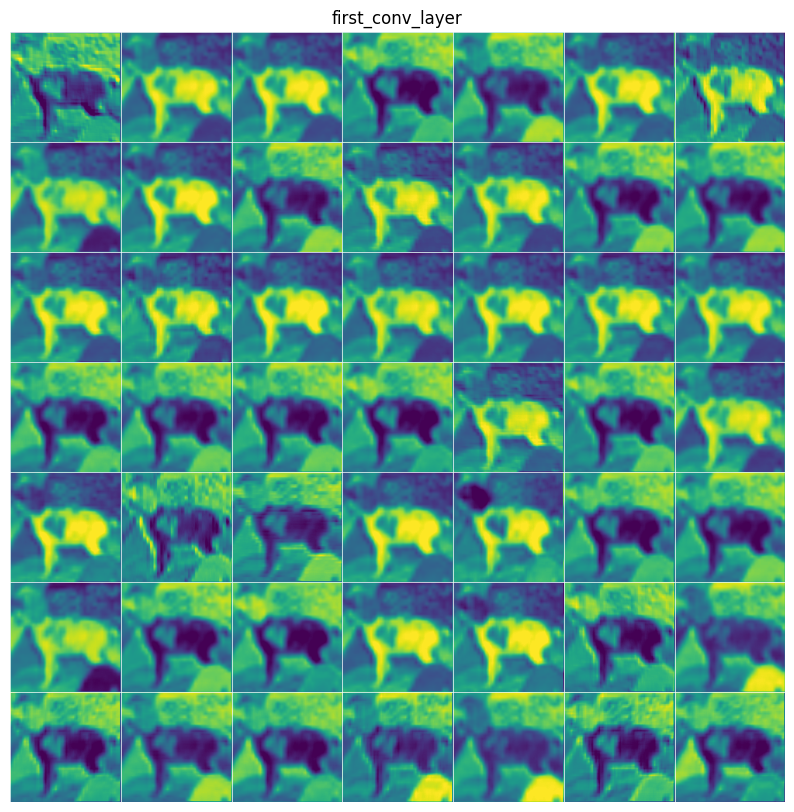

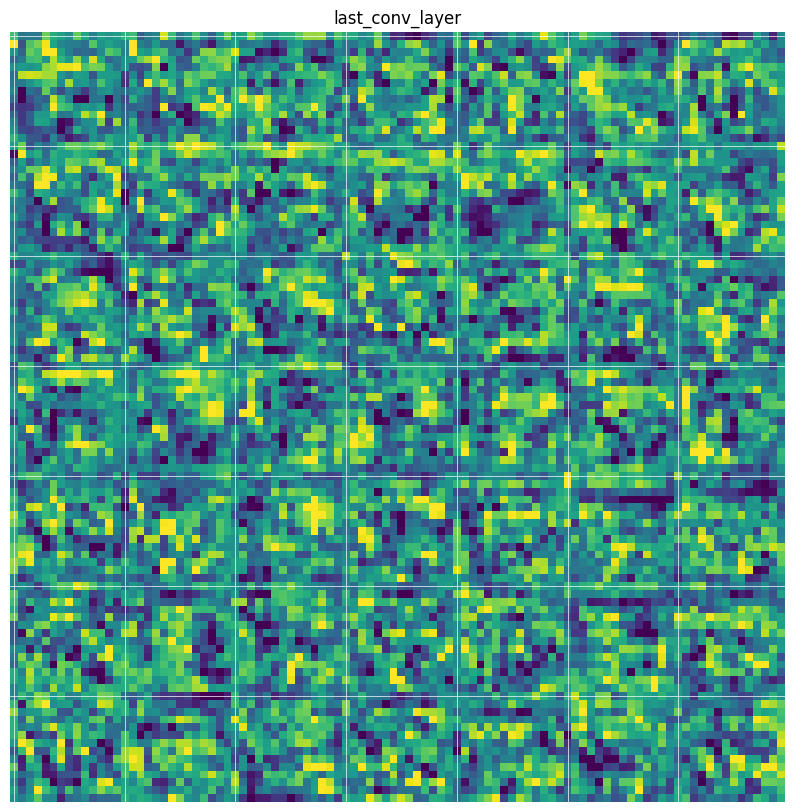

In [ ]:
for layer_name, activation in activations.items():
    n_features = 50
    size = activation.shape[2]

    n_cols = int(np.sqrt(n_features))
    display_grid = np.zeros((size * n_cols, n_cols * size))

    for col in range(n_cols):
        for row in range(n_cols):
            if col * n_cols + row < n_features:
                channel_image = activation[0, col * n_cols + row].cpu().numpy()
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = size / display_grid.shape[1]
    plt.figure(figsize=(10, 10))
    plt.title(layer_name)
    plt.imshow(display_grid, aspect='auto')

    for i in range(0, display_grid.shape[0], size):
        plt.axhline(y=i, color='white', linewidth=0.5)
    for j in range(0, display_grid.shape[1], size):
        plt.axvline(x=j, color='white', linewidth=0.5)

    plt.grid(False)
    plt.axis('off')

plt.show()


[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)\
Epoch20

In [ ]:
import torchvision.models as models
checkpoint_path = "/content/model_weights_epoch_20.pth"
checkpoint = torch.load(checkpoint_path)
vgg_model.load_state_dict(checkpoint)
vgg_model.eval()
# Define the register_hook function
def register_hook(layer, layer_name):
    def hook(module, input, output):
        activations[layer_name] = output
    return hook

# Register hooks for visualization
vgg_model.conv_layer_1.register_forward_hook(register_hook(vgg_model.conv_layer_1, 'first_conv_layer'))
vgg_model.conv_layer_13.register_forward_hook(register_hook(vgg_model.conv_layer_13, 'last_conv_layer'))

In [ ]:
img_tensor = vis_image.to(device)
with torch.no_grad():
    _ = vgg_model(img_tensor)


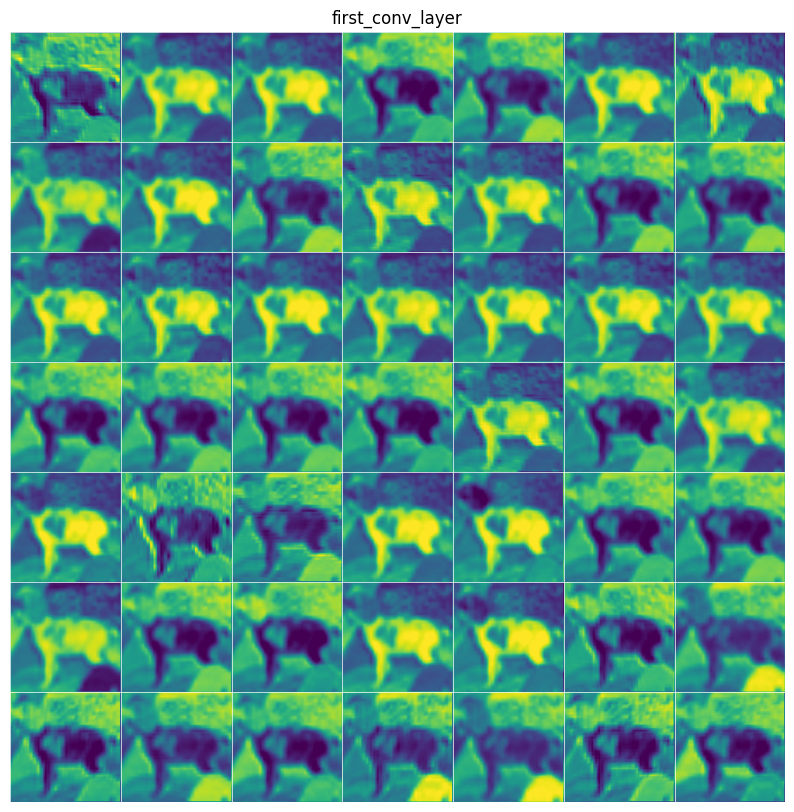

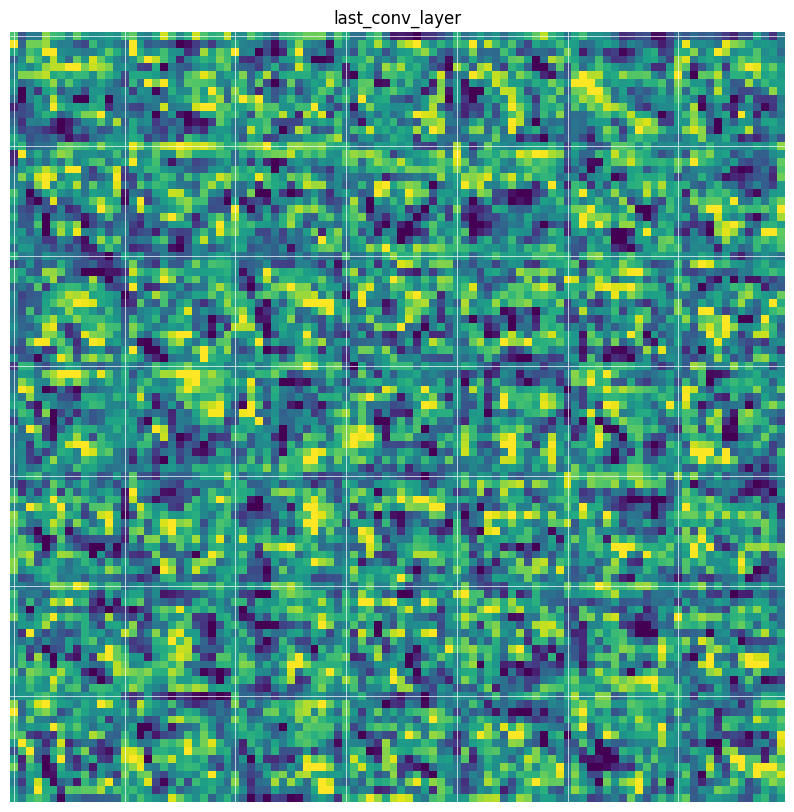

In [ ]:
for layer_name, activation in activations.items():
    n_features = 50
    size = activation.shape[2]

    n_cols = int(np.sqrt(n_features))
    display_grid = np.zeros((size * n_cols, n_cols * size))

    for col in range(n_cols):
        for row in range(n_cols):
            if col * n_cols + row < n_features:
                channel_image = activation[0, col * n_cols + row].cpu().numpy()
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = size / display_grid.shape[1]
    plt.figure(figsize=(10, 10))
    plt.title(layer_name)
    plt.imshow(display_grid, aspect='auto')

    for i in range(0, display_grid.shape[0], size):
        plt.axhline(y=i, color='white', linewidth=0.5)
    for j in range(0, display_grid.shape[1], size):
        plt.axvline(x=j, color='white', linewidth=0.5)

    plt.grid(False)
    plt.axis('off')

plt.show()


[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)\
epoch 15

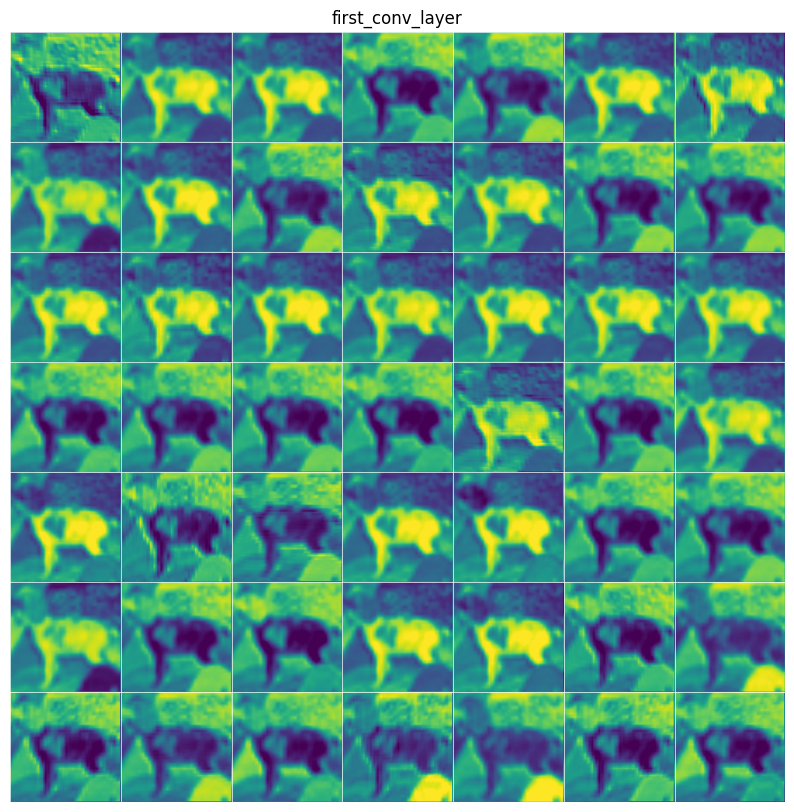

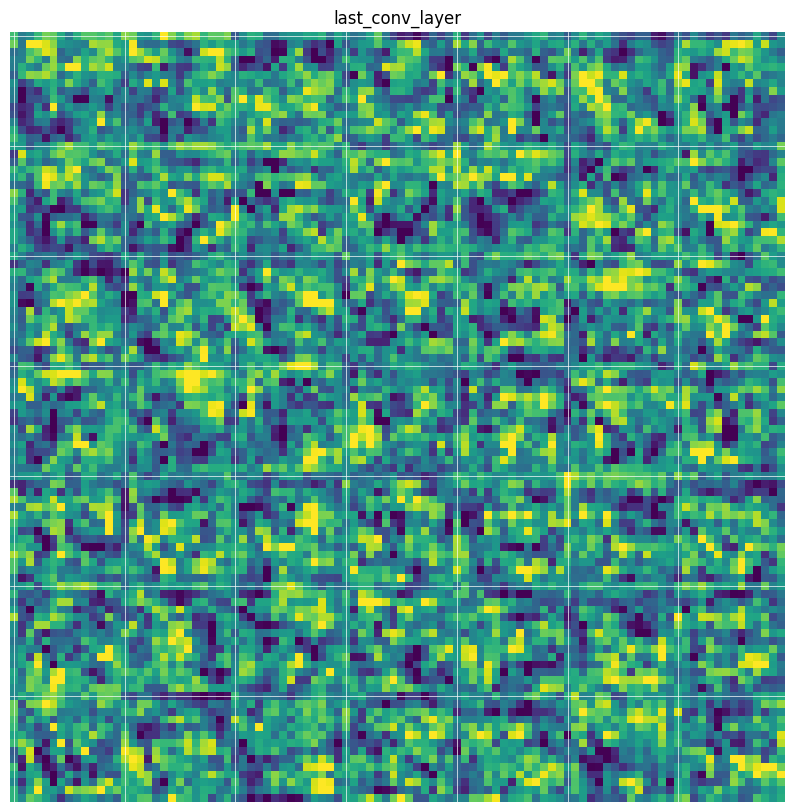

In [ ]:
import torchvision.models as models
checkpoint_path = "/content/model_weights_epoch_15.pth"
checkpoint = torch.load(checkpoint_path)
vgg_model.load_state_dict(checkpoint)
vgg_model.eval()
# Define the register_hook function
def register_hook(layer, layer_name):
    def hook(module, input, output):
        activations[layer_name] = output
    return hook

# Register hooks for visualization
vgg_model.conv_layer_1.register_forward_hook(register_hook(vgg_model.conv_layer_1, 'first_conv_layer'))
vgg_model.conv_layer_13.register_forward_hook(register_hook(vgg_model.conv_layer_13, 'last_conv_layer'))

img_tensor = vis_image.to(device)
with torch.no_grad():
    _ = vgg_model(img_tensor)
for layer_name, activation in activations.items():
    n_features = 50
    size = activation.shape[2]

    n_cols = int(np.sqrt(n_features))
    display_grid = np.zeros((size * n_cols, n_cols * size))

    for col in range(n_cols):
        for row in range(n_cols):
            if col * n_cols + row < n_features:
                channel_image = activation[0, col * n_cols + row].cpu().numpy()
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = size / display_grid.shape[1]
    plt.figure(figsize=(10, 10))
    plt.title(layer_name)
    plt.imshow(display_grid, aspect='auto')

    for i in range(0, display_grid.shape[0], size):
        plt.axhline(y=i, color='white', linewidth=0.5)
    for j in range(0, display_grid.shape[1], size):
        plt.axvline(x=j, color='white', linewidth=0.5)

    plt.grid(False)
    plt.axis('off')

plt.show()


[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)\
epoch 10

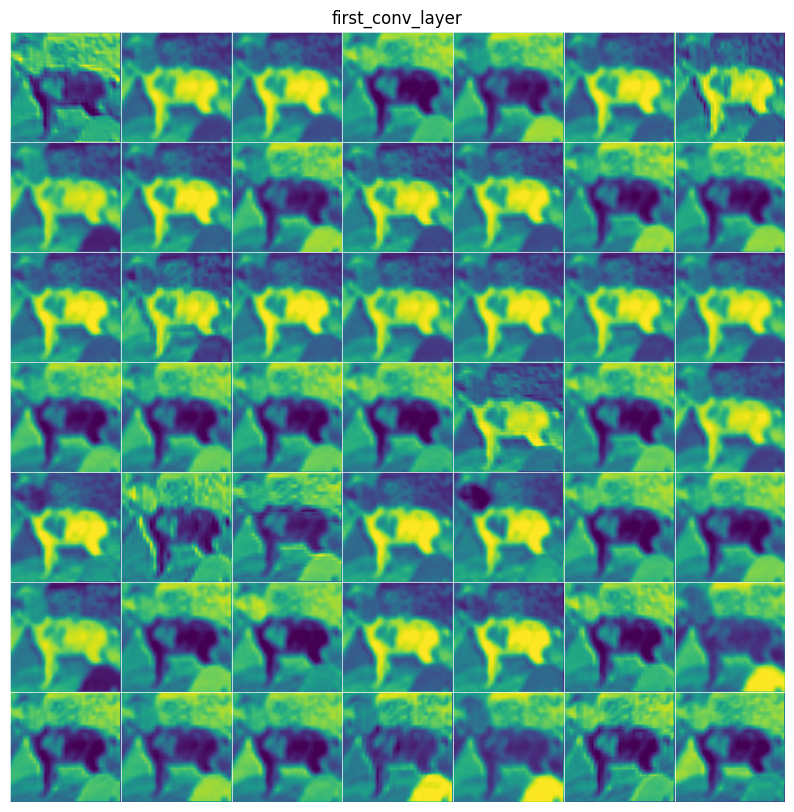

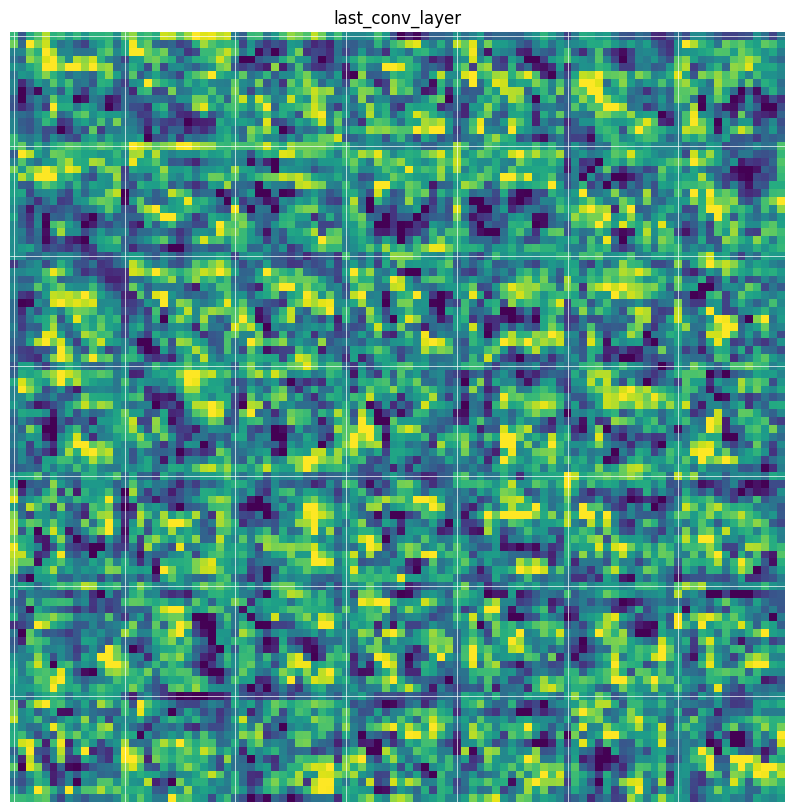

In [ ]:
import torchvision.models as models
checkpoint_path = "/content/model_weights_epoch_10.pth"
checkpoint = torch.load(checkpoint_path)
vgg_model.load_state_dict(checkpoint)
vgg_model.eval()
# Define the register_hook function
def register_hook(layer, layer_name):
    def hook(module, input, output):
        activations[layer_name] = output
    return hook

# Register hooks for visualization
vgg_model.conv_layer_1.register_forward_hook(register_hook(vgg_model.conv_layer_1, 'first_conv_layer'))
vgg_model.conv_layer_13.register_forward_hook(register_hook(vgg_model.conv_layer_13, 'last_conv_layer'))

img_tensor = vis_image.to(device)
with torch.no_grad():
    _ = vgg_model(img_tensor)
for layer_name, activation in activations.items():
    n_features = 50
    size = activation.shape[2]

    n_cols = int(np.sqrt(n_features))
    display_grid = np.zeros((size * n_cols, n_cols * size))

    for col in range(n_cols):
        for row in range(n_cols):
            if col * n_cols + row < n_features:
                channel_image = activation[0, col * n_cols + row].cpu().numpy()
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = size / display_grid.shape[1]
    plt.figure(figsize=(10, 10))
    plt.title(layer_name)
    plt.imshow(display_grid, aspect='auto')

    for i in range(0, display_grid.shape[0], size):
        plt.axhline(y=i, color='white', linewidth=0.5)
    for j in range(0, display_grid.shape[1], size):
        plt.axvline(x=j, color='white', linewidth=0.5)

    plt.grid(False)
    plt.axis('off')

plt.show()


[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)\
epoch 5

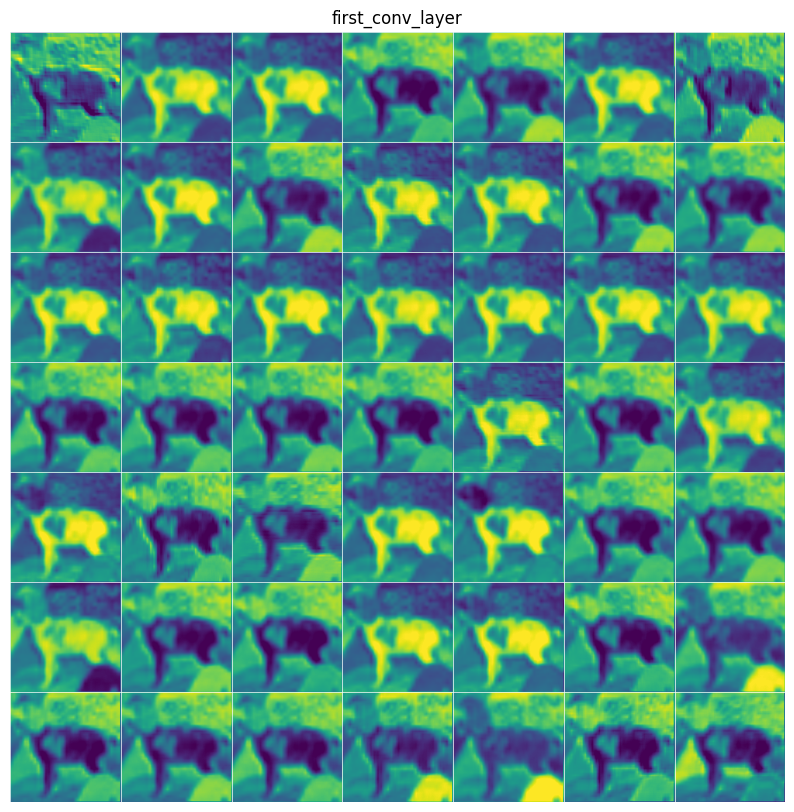

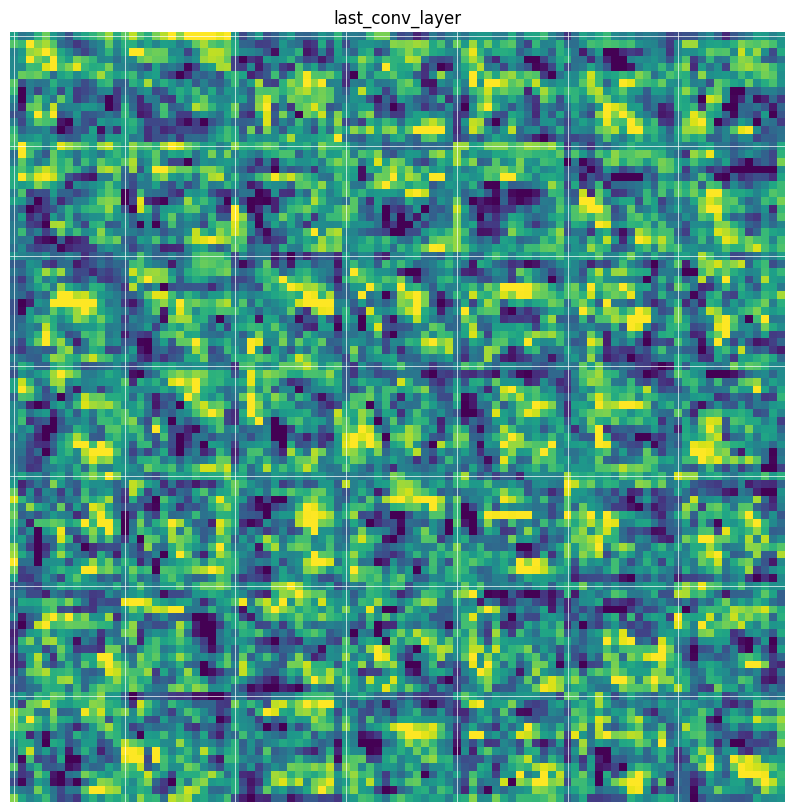

In [ ]:
import torchvision.models as models
checkpoint_path = "/content/model_weights_epoch_5.pth"
checkpoint = torch.load(checkpoint_path)
vgg_model.load_state_dict(checkpoint)
vgg_model.eval()
# Define the register_hook function
def register_hook(layer, layer_name):
    def hook(module, input, output):
        activations[layer_name] = output
    return hook

# Register hooks for visualization
vgg_model.conv_layer_1.register_forward_hook(register_hook(vgg_model.conv_layer_1, 'first_conv_layer'))
vgg_model.conv_layer_13.register_forward_hook(register_hook(vgg_model.conv_layer_13, 'last_conv_layer'))

img_tensor = vis_image.to(device)
with torch.no_grad():
    _ = vgg_model(img_tensor)
for layer_name, activation in activations.items():
    n_features = 50
    size = activation.shape[2]

    n_cols = int(np.sqrt(n_features))
    display_grid = np.zeros((size * n_cols, n_cols * size))

    for col in range(n_cols):
        for row in range(n_cols):
            if col * n_cols + row < n_features:
                channel_image = activation[0, col * n_cols + row].cpu().numpy()
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = size / display_grid.shape[1]
    plt.figure(figsize=(10, 10))
    plt.title(layer_name)
    plt.imshow(display_grid, aspect='auto')

    for i in range(0, display_grid.shape[0], size):
        plt.axhline(y=i, color='white', linewidth=0.5)
    for j in range(0, display_grid.shape[1], size):
        plt.axvline(x=j, color='white', linewidth=0.5)

    plt.grid(False)
    plt.axis('off')

plt.show()


In [ ]:
def get_activations(model, data_loader, layer_name):
    model.eval()
    activations = []

    def hook(module, input, output):
        activations.append(output.cpu().numpy())

    layer = getattr(model, layer_name)
    hook_handle = layer.register_forward_hook(hook)

    with torch.no_grad():
        for inputs, _ in data_loader:
            inputs = inputs.to(device)
            model(inputs)

    hook_handle.remove()
    return np.concatenate(activations, axis=0)

[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)
#T-SNE Visualizations
We have not used these, due to them being somewhat inconclusive.

In [ ]:
def visualize_tsne(model, data_loader, layer_name):
    # Get activations
    activations = get_activations(model, data_loader, layer_name)

    # Flatten the activations
    flat_activations = activations.reshape(activations.shape[0], -1)

    # Apply t-SNE
    tsne = TSNE(n_components=2, random_state=42)
    tsne_result = tsne.fit_transform(flat_activations)

    # Visualize the t-SNE result
    plt.figure(figsize=(10, 8))
    plt.scatter(tsne_result[:, 0], tsne_result[:, 1], cmap='viridis', alpha=0.5)
    plt.title(f't-SNE Visualization of {layer_name} Activations')
    plt.show()

<ipython-input-16-38d61fb09f98>:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(tsne_result[:, 0], tsne_result[:, 1], cmap='viridis', alpha=0.5)


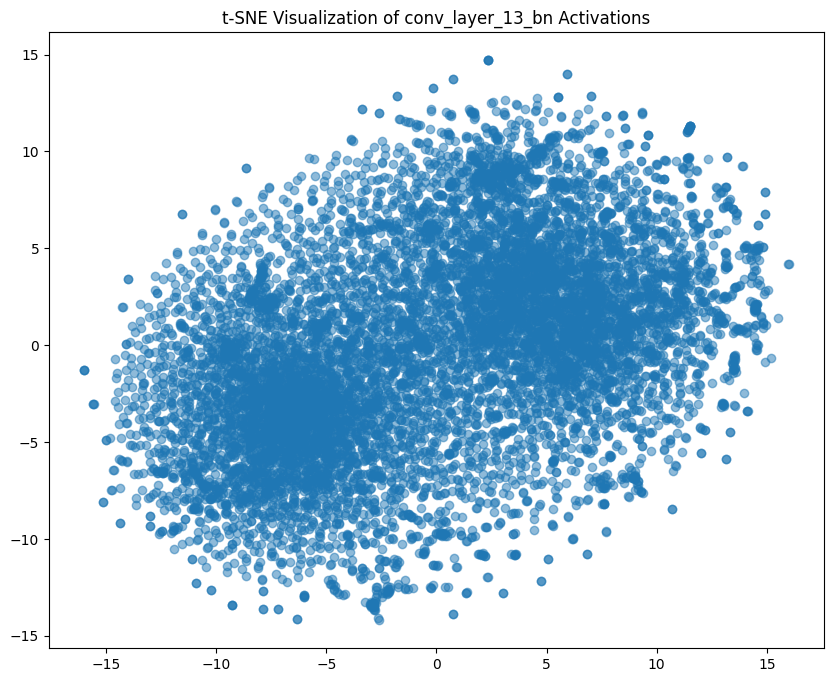

In [ ]:
visualize_tsne(model, val_loader, 'conv_layer_13_bn')


[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)
#Residual Network
In order to compare results, we have set up a network that uses all the same parameters as the previously implemented Vgg-16 network, while also implementeing 5 residual blocks. We have implemented it as such for the sake of fairer comparison during analysis.

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
import torch

class VGG16plusresidual(nn.Module):
    """This class implements the VGG-16 architecture with Residual Connections in PyTorch"""

    def __init__(self, activation_str="relu"):
        super(VGG16plusresidual, self).__init__()

        self.n_classes = 10
        self.activation_str = activation_str

        # Convolutional Layers
        self.conv_layer_1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1, stride=1)
        self.conv_layer_2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1)
        self.conv_layer_3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        self.conv_layer_4 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1)
        self.conv_layer_5 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1)
        self.conv_layer_6 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1)
        self.conv_layer_7 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1)
        self.conv_layer_8 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1)
        self.conv_layer_9 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)
        self.conv_layer_10 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)
        self.conv_layer_11 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)
        self.conv_layer_12 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)
        self.conv_layer_13 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)

        # Batch Normalization
        self.conv_layer_1_bn = nn.BatchNorm2d(64)
        self.conv_layer_2_bn = nn.BatchNorm2d(64)
        self.conv_layer_3_bn = nn.BatchNorm2d(128)
        self.conv_layer_4_bn = nn.BatchNorm2d(128)
        self.conv_layer_5_bn = nn.BatchNorm2d(256)
        self.conv_layer_6_bn = nn.BatchNorm2d(256)
        self.conv_layer_7_bn = nn.BatchNorm2d(256)
        self.conv_layer_8_bn = nn.BatchNorm2d(512)
        self.conv_layer_9_bn = nn.BatchNorm2d(512)
        self.conv_layer_10_bn = nn.BatchNorm2d(512)
        self.conv_layer_11_bn = nn.BatchNorm2d(512)
        self.conv_layer_12_bn = nn.BatchNorm2d(512)
        self.conv_layer_13_bn = nn.BatchNorm2d(512)

        # Max Pooling Layers
        self.max_pool_layer_1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.max_pool_layer_2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.max_pool_layer_3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.max_pool_layer_4 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.max_pool_layer_5 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Fully Connected Layers
        self.fc_1 = nn.Linear(512*7*7, 4096)
        self.fc_2 = nn.Linear(4096, 4096)
        self.fc_3 = nn.Linear(4096, self.n_classes)

        # Residual Connections
        self.residual_2 = nn.Identity()
        self.residual_4 = nn.Identity()
        self.residual_7 = nn.Identity()
        self.residual_10 = nn.Identity()
        self.residual_13 = nn.Identity()

        # Weight Initialization
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.xavier_uniform_(m.weight)
            elif isinstance(m, nn.Linear):
                init.xavier_uniform_(m.weight)

    def activation(self, input):
        if self.activation_str == "relu":
            return F.relu(input)
        elif self.activation_str == "tanh":
            return torch.tanh(input)
        else:
            raise Exception("Invalid activation")

    def forward(self, x):

        x = self.conv_layer_1_bn(self.conv_layer_1(x))
        x = self.activation(x)
        residual_layer = self.residual_2(x)
        x = self.conv_layer_2_bn(self.conv_layer_2(x))
        x = self.activation(x + residual_layer)   # Adding the residual connection
        x = self.max_pool_layer_1(x)


        x = self.conv_layer_3_bn(self.conv_layer_3(x))
        x = self.activation(x)
        residual_layer = self.residual_4(x)
        x = self.conv_layer_4_bn(self.conv_layer_4(x))
        x = self.activation(x + residual_layer)
        x = self.max_pool_layer_2(x)

        x = self.conv_layer_5_bn(self.conv_layer_5(x))
        x = self.activation(x)
        residual_layer = self.residual_7(x)
        x = self.conv_layer_6_bn(self.conv_layer_6(x))
        x = self.activation(x)
        x = self.conv_layer_7_bn(self.conv_layer_7(x))
        x = self.activation(x + residual_layer)
        x = self.max_pool_layer_3(x)


        x = self.conv_layer_8_bn(self.conv_layer_8(x))
        x = self.activation(x)
        residual_layer = self.residual_10(x)
        x = self.conv_layer_9_bn(self.conv_layer_9(x))
        x = self.activation(x)
        x = self.conv_layer_10_bn(self.conv_layer_10(x))
        x = self.activation(x + residual_layer)
        x = self.max_pool_layer_4(x)


        x = self.conv_layer_11_bn(self.conv_layer_11(x))
        x = self.activation(x)
        residual_layer = self.residual_13(x)
        x = self.conv_layer_12_bn(self.conv_layer_12(x))
        x = self.activation(x)
        x = self.conv_layer_13_bn(self.conv_layer_13(x))
        x = self.activation(x + residual_layer)
        x = self.max_pool_layer_5(x)

        x = x.view(x.size(0), -1)

        x = self.activation(self.fc_1(x))
        x = self.activation(self.fc_2(x))
        x = self.fc_3(x)
        x = F.softmax(x, dim=1)

        return x


[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)
#Training
We have implemented the training block for this network using the same parameters as the base Vgg-16 netowrk.

In [ ]:
if __name__ == "__main__":
  activation_str = "relu"
  initialization = "xavier_normal"
  train_accs, train_losses, val_accs, val_losses = [], [], [], []
  n_epochs = 25

  model = VGG16plusresidual(
    activation_str=activation_str,

  ).to(device)
  criterion = nn.CrossEntropyLoss()
  optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

  train_loader, val_loader = get_cifar10()

  for epoch in range(n_epochs):
    # Training
    train_acc, train_loss = train_loop(epoch, model, train_loader, criterion, optimizer)
    train_accs.append(train_acc)
    train_losses.append(train_loss)

    # Validation
    val_acc, val_loss = valid_loop(epoch, model, val_loader, criterion)
    val_accs.append(val_acc)
    val_losses.append(val_loss)
    if (epoch + 1) % 5 == 0:
      torch.save(model.state_dict(), f'model_weights_epoch_withRes_{epoch+1}.pth')
    torch.save(model.state_dict(), 'model_weights_epoch_withRes_25.pth')


Files already downloaded and verified
Files already downloaded and verified
Epoch: 0 | Train Acc: 0.403180 | Train Loss: 0.032101
Epoch: 0 | Val Acc: 0.486000   | Val Loss: 0.030966
Epoch: 1 | Train Acc: 0.522980 | Train Loss: 0.030280
Epoch: 1 | Val Acc: 0.518800   | Val Loss: 0.030456
Epoch: 2 | Train Acc: 0.589020 | Train Loss: 0.029285
Epoch: 2 | Val Acc: 0.555900   | Val Loss: 0.029887
Epoch: 3 | Train Acc: 0.633080 | Train Loss: 0.028595
Epoch: 3 | Val Acc: 0.624200   | Val Loss: 0.028839
Epoch: 4 | Train Acc: 0.679520 | Train Loss: 0.027893
Epoch: 4 | Val Acc: 0.661100   | Val Loss: 0.028275
Epoch: 5 | Train Acc: 0.714860 | Train Loss: 0.027344
Epoch: 5 | Val Acc: 0.686900   | Val Loss: 0.027881
Epoch: 6 | Train Acc: 0.749140 | Train Loss: 0.026843
Epoch: 6 | Val Acc: 0.697400   | Val Loss: 0.027705
Epoch: 7 | Train Acc: 0.776760 | Train Loss: 0.026411
Epoch: 7 | Val Acc: 0.703100   | Val Loss: 0.027656
Epoch: 8 | Train Acc: 0.802420 | Train Loss: 0.026023
Epoch: 8 | Val Acc: 0.

[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)
#Training Plot
Interesting to note that compared to the base model, this one generalizes a bit better (lower training accuracy, but higher validation accuracy) and seems to converge a bit earlier.

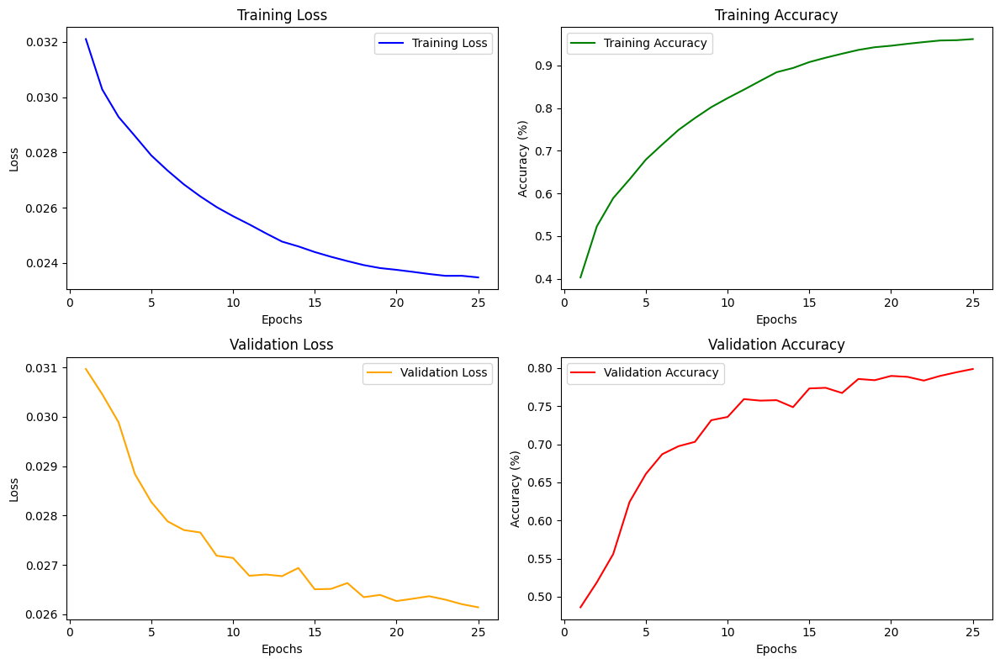

In [ ]:
import numpy as np

epochs=np.arange(1, 26)
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(epochs, train_losses, label='Training Loss', color='blue')
plt.title('Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.subplot(2, 2, 2)
plt.plot(epochs, train_accs, label='Training Accuracy', color='green')
plt.title('Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.subplot(2, 2, 3)
plt.plot(epochs, val_losses, label='Validation Loss', color='orange')
plt.title('Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.subplot(2, 2, 4)
plt.plot(epochs, val_accs, label='Validation Accuracy', color='red')
plt.title('Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
def visualize_filters(filters, n=6):

    f_min, f_max = filters.min(), filters.max()
    filters = (filters - f_min) / (f_max - f_min)
    fig, axes = plt.subplots(1, n, figsize=(15, 3))

    for i, ax in enumerate(axes):
        cax = ax.imshow(filters[i], cmap='gray')
        ax.axis('off')
        fig.colorbar(cax, ax=ax, orientation='vertical', fraction=0.045, pad=0.04)

    plt.show()

[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)\
The following blocks simulate activation to be bale to visualize layer output at specific points.

In [ ]:
normalize = transforms.Normalize(
    mean=[0.4914, 0.4822, 0.4465],
    std=[0.2023, 0.1994, 0.2010],
)
transform = transforms.Compose([
    transforms.Resize((227, 227)),
    transforms.ToTensor(),
    normalize
])

val_dataset = torchvision.datasets.CIFAR10(
    root='./data', train=False, download=True, transform=transform)
val_loader = torch.utils.data.DataLoader(
    val_dataset, batch_size=64, shuffle=False, num_workers=2)

Files already downloaded and verified


In [ ]:
if __name__ == "__main__":
  vis_image = None
  for data, labels in val_loader:
    vis_image = data[12].unsqueeze(0)
    break
vis_image.shape

torch.Size([1, 3, 227, 227])

In [ ]:
activations = {}

def register_hook(layer, layer_name):
    def hook(module, input, output):
        activations[layer_name] = output
    return hook
vgg_model = model
vgg_model.conv_layer_1.register_forward_hook(register_hook(vgg_model.conv_layer_1, 'first_conv_layer'))
vgg_model.conv_layer_13.register_forward_hook(register_hook(vgg_model.conv_layer_13, 'last_conv_layer'))

In [ ]:
img_tensor = vis_image.to(device)
with torch.no_grad():
    _ = vgg_model(img_tensor)


In [ ]:
def get_activations(model, data_loader, layer_name):
    model.eval()
    activations = []

    def hook(module, input, output):
        activations.append(output.cpu().numpy())

    layer = getattr(model, layer_name)
    hook_handle = layer.register_forward_hook(hook)

    with torch.no_grad():
        for inputs, _ in data_loader:
            inputs = inputs.to(device)
            model(inputs)

    hook_handle.remove()
    return np.concatenate(activations, axis=0)

[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)
#Layer Visualization
Same idea as in the previous block, visualizing layer output (first and last conv. layer) at epochs 5, 10, 15, 20, 25.

epoch 5

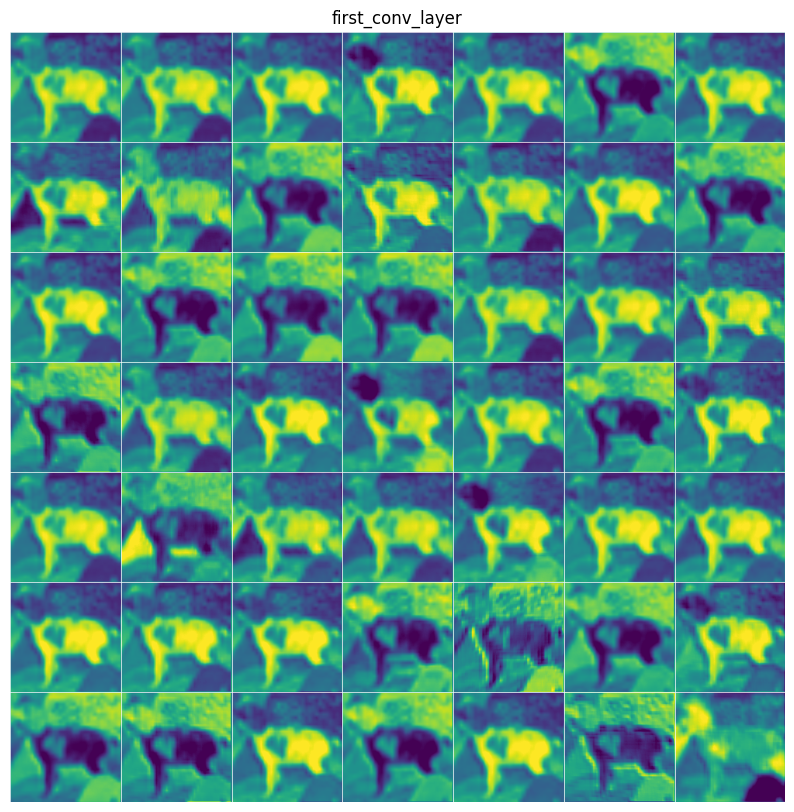

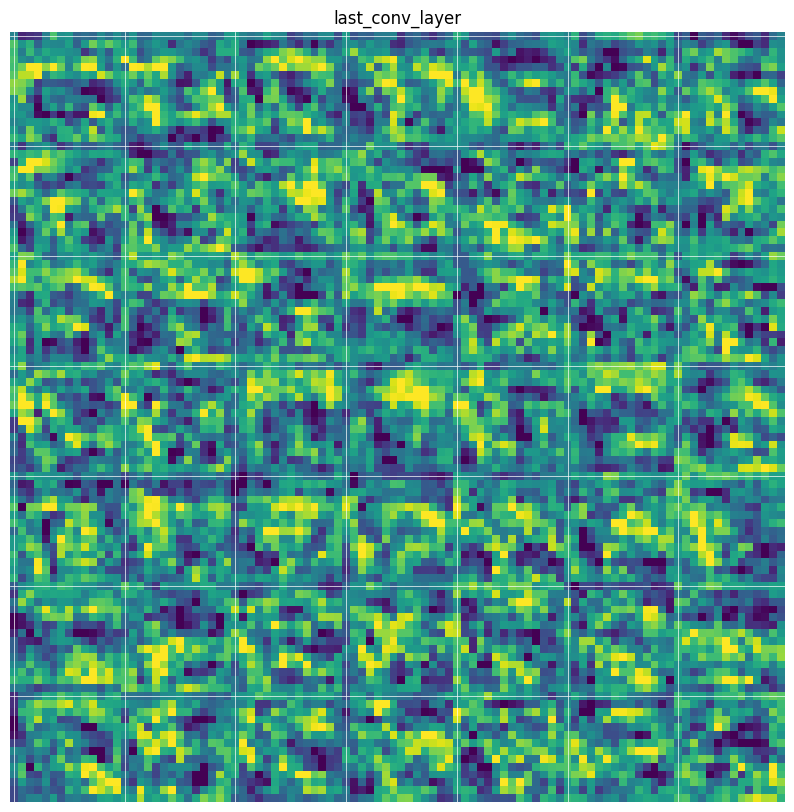

In [ ]:
import torchvision.models as models
checkpoint_path = "/content/model_weights_epoch_withRes_5.pth"
checkpoint = torch.load(checkpoint_path)
vgg_model.load_state_dict(checkpoint)
vgg_model.eval()
# Define the register_hook function
def register_hook(layer, layer_name):
    def hook(module, input, output):
        activations[layer_name] = output
    return hook

# Register hooks for visualization
vgg_model.conv_layer_1.register_forward_hook(register_hook(vgg_model.conv_layer_1, 'first_conv_layer'))
vgg_model.conv_layer_13.register_forward_hook(register_hook(vgg_model.conv_layer_13, 'last_conv_layer'))

img_tensor = vis_image.to(device)
with torch.no_grad():
    _ = vgg_model(img_tensor)
for layer_name, activation in activations.items():
    n_features = 50
    size = activation.shape[2]

    n_cols = int(np.sqrt(n_features))
    display_grid = np.zeros((size * n_cols, n_cols * size))

    for col in range(n_cols):
        for row in range(n_cols):
            if col * n_cols + row < n_features:
                channel_image = activation[0, col * n_cols + row].cpu().numpy()
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = size / display_grid.shape[1]
    plt.figure(figsize=(10, 10))
    plt.title(layer_name)
    plt.imshow(display_grid, aspect='auto')

    for i in range(0, display_grid.shape[0], size):
        plt.axhline(y=i, color='white', linewidth=0.5)
    for j in range(0, display_grid.shape[1], size):
        plt.axvline(x=j, color='white', linewidth=0.5)

    plt.grid(False)
    plt.axis('off')

plt.show()


[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)\
Resnet epoch 10

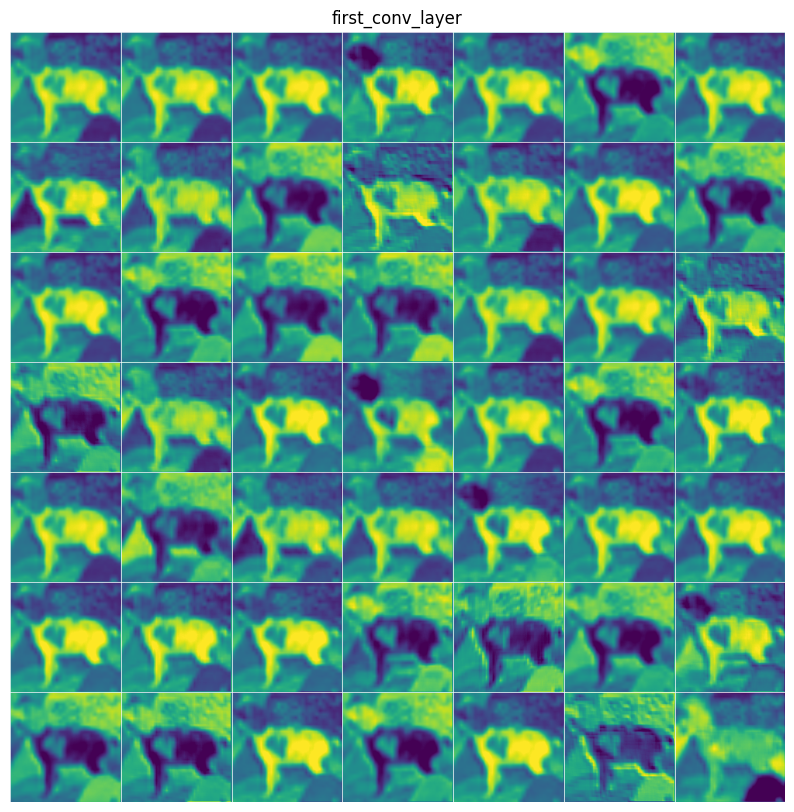

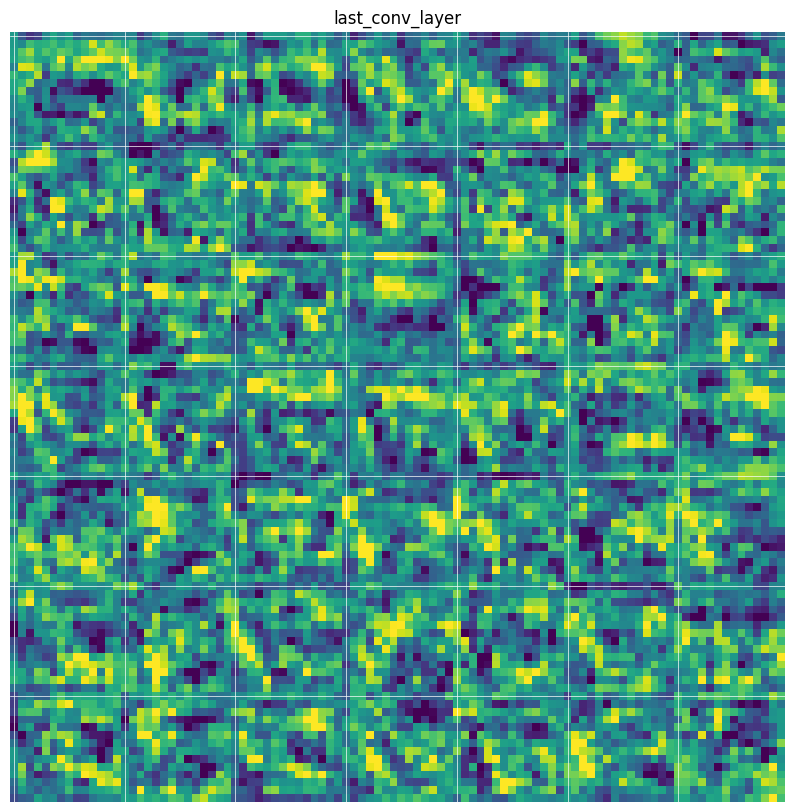

In [ ]:
import torchvision.models as models
checkpoint_path = "/content/model_weights_epoch_withRes_10.pth"
checkpoint = torch.load(checkpoint_path)
vgg_model.load_state_dict(checkpoint)
vgg_model.eval()
# Define the register_hook function
def register_hook(layer, layer_name):
    def hook(module, input, output):
        activations[layer_name] = output
    return hook

# Register hooks for visualization
vgg_model.conv_layer_1.register_forward_hook(register_hook(vgg_model.conv_layer_1, 'first_conv_layer'))
vgg_model.conv_layer_13.register_forward_hook(register_hook(vgg_model.conv_layer_13, 'last_conv_layer'))

img_tensor = vis_image.to(device)
with torch.no_grad():
    _ = vgg_model(img_tensor)
for layer_name, activation in activations.items():
    n_features = 50
    size = activation.shape[2]

    n_cols = int(np.sqrt(n_features))
    display_grid = np.zeros((size * n_cols, n_cols * size))

    for col in range(n_cols):
        for row in range(n_cols):
            if col * n_cols + row < n_features:
                channel_image = activation[0, col * n_cols + row].cpu().numpy()
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = size / display_grid.shape[1]
    plt.figure(figsize=(10, 10))
    plt.title(layer_name)
    plt.imshow(display_grid, aspect='auto')

    for i in range(0, display_grid.shape[0], size):
        plt.axhline(y=i, color='white', linewidth=0.5)
    for j in range(0, display_grid.shape[1], size):
        plt.axvline(x=j, color='white', linewidth=0.5)

    plt.grid(False)
    plt.axis('off')

plt.show()


[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)\
Resnet epoch 15

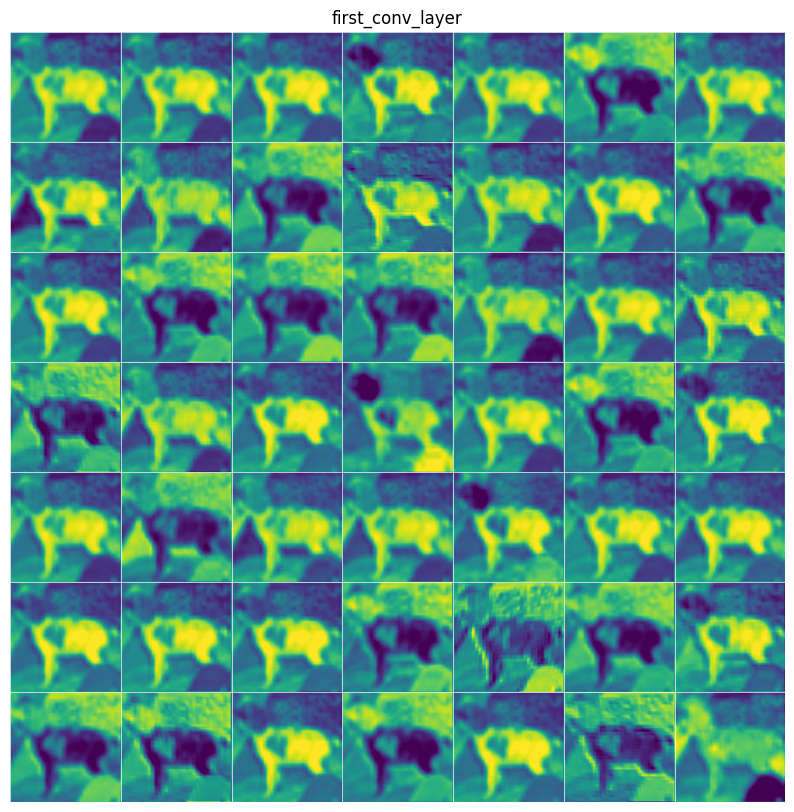

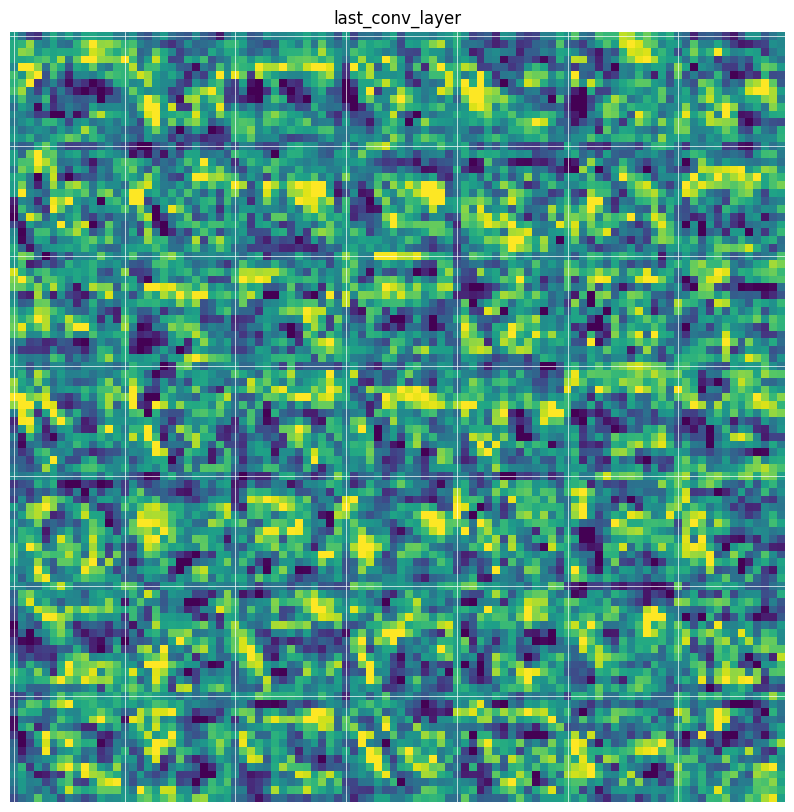

In [ ]:
import torchvision.models as models
checkpoint_path = "/content/model_weights_epoch_withRes_15.pth"
checkpoint = torch.load(checkpoint_path)
vgg_model.load_state_dict(checkpoint)
vgg_model.eval()
# Define the register_hook function
def register_hook(layer, layer_name):
    def hook(module, input, output):
        activations[layer_name] = output
    return hook

# Register hooks for visualization
vgg_model.conv_layer_1.register_forward_hook(register_hook(vgg_model.conv_layer_1, 'first_conv_layer'))
vgg_model.conv_layer_13.register_forward_hook(register_hook(vgg_model.conv_layer_13, 'last_conv_layer'))

img_tensor = vis_image.to(device)
with torch.no_grad():
    _ = vgg_model(img_tensor)
for layer_name, activation in activations.items():
    n_features = 50
    size = activation.shape[2]

    n_cols = int(np.sqrt(n_features))
    display_grid = np.zeros((size * n_cols, n_cols * size))

    for col in range(n_cols):
        for row in range(n_cols):
            if col * n_cols + row < n_features:
                channel_image = activation[0, col * n_cols + row].cpu().numpy()
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = size / display_grid.shape[1]
    plt.figure(figsize=(10, 10))
    plt.title(layer_name)
    plt.imshow(display_grid, aspect='auto')

    for i in range(0, display_grid.shape[0], size):
        plt.axhline(y=i, color='white', linewidth=0.5)
    for j in range(0, display_grid.shape[1], size):
        plt.axvline(x=j, color='white', linewidth=0.5)

    plt.grid(False)
    plt.axis('off')

plt.show()


[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)\
ResNet epoch 20

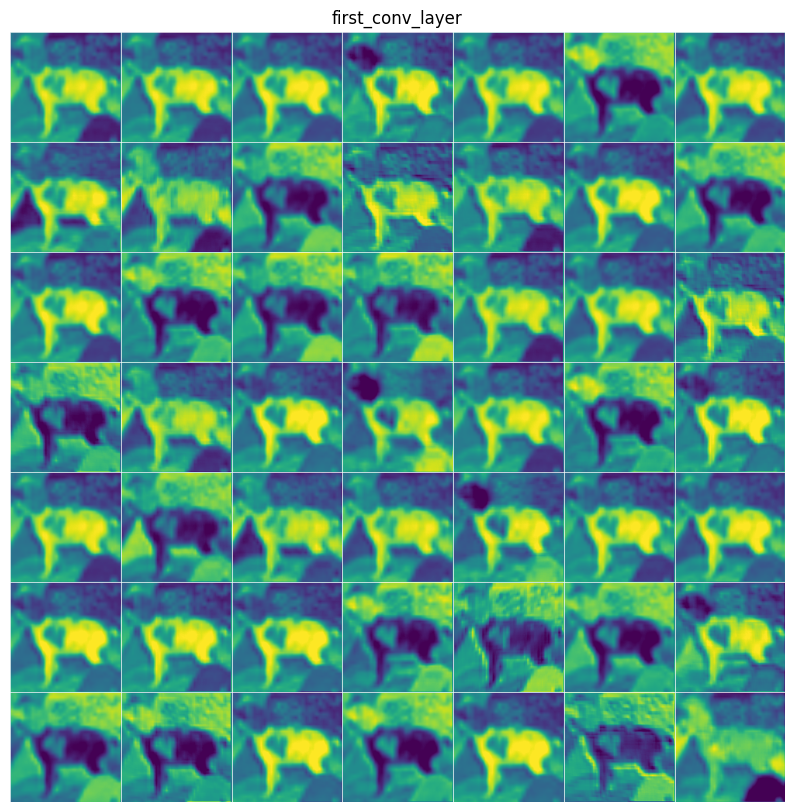

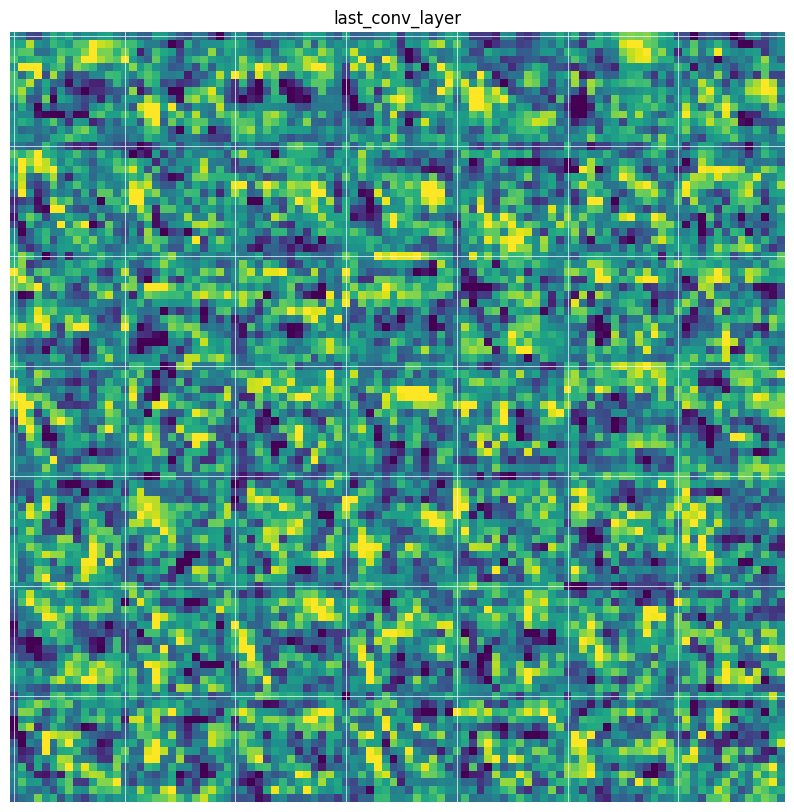

In [ ]:
import torchvision.models as models
checkpoint_path = "/content/model_weights_epoch_withRes_20.pth"
checkpoint = torch.load(checkpoint_path)
vgg_model.load_state_dict(checkpoint)
vgg_model.eval()
# Define the register_hook function
def register_hook(layer, layer_name):
    def hook(module, input, output):
        activations[layer_name] = output
    return hook

# Register hooks for visualization
vgg_model.conv_layer_1.register_forward_hook(register_hook(vgg_model.conv_layer_1, 'first_conv_layer'))
vgg_model.conv_layer_13.register_forward_hook(register_hook(vgg_model.conv_layer_13, 'last_conv_layer'))

img_tensor = vis_image.to(device)
with torch.no_grad():
    _ = vgg_model(img_tensor)
for layer_name, activation in activations.items():
    n_features = 50
    size = activation.shape[2]

    n_cols = int(np.sqrt(n_features))
    display_grid = np.zeros((size * n_cols, n_cols * size))

    for col in range(n_cols):
     for name, param in model.named_parameters():
        print(f"Layer: {name}, Size: {param.size()}")
        print(param)   for row in range(n_cols):
                if col * n_cols + row < n_features:
                    channel_image = activation[0, col * n_cols + row].cpu().numpy()
                    channel_image -= channel_image.mean()
                    channel_image /= channel_image.std()
                    channel_image *= 64
                    channel_image += 128
                    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                    display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = size / display_grid.shape[1]
    plt.figure(figsize=(10, 10))
    plt.title(layer_name)
    plt.imshow(display_grid, aspect='auto')

    for i in range(0, display_grid.shape[0], size):
        plt.axhline(y=i, color='white', linewidth=0.5)
    for j in range(0, display_grid.shape[1], size):
        plt.axvline(x=j, color='white', linewidth=0.5)

    plt.grid(False)
    plt.axis('off')

plt.show()


[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)\
ResNet epoch 25

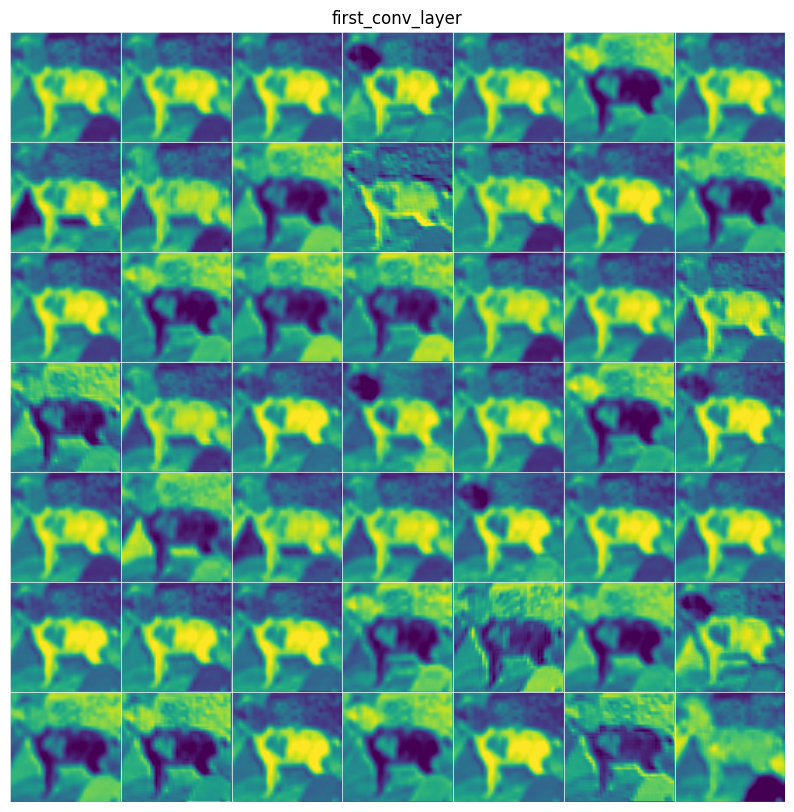

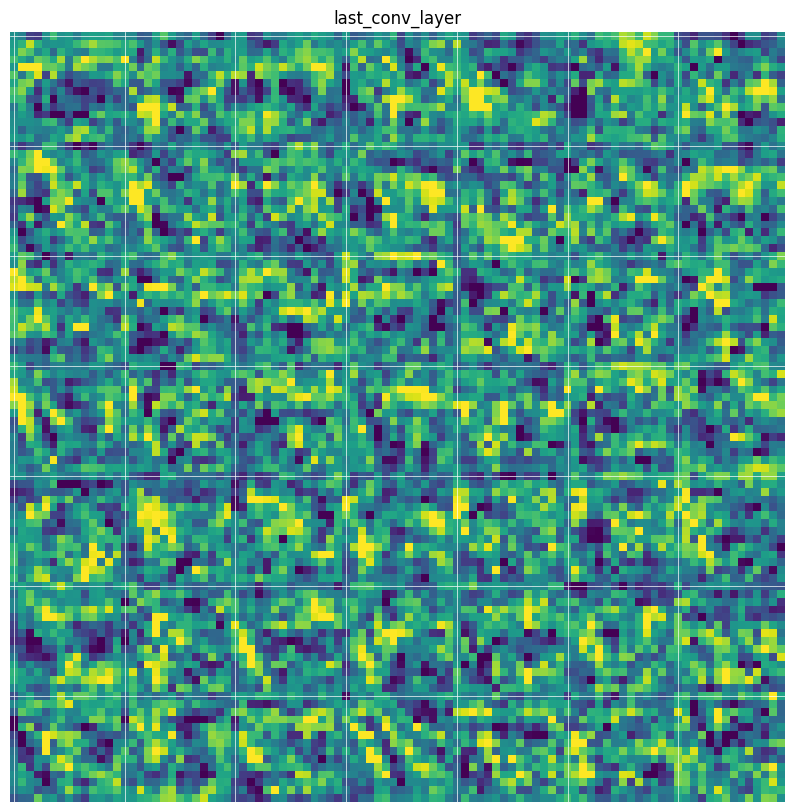

In [ ]:
for layer_name, activation in activations.items():
    n_features = 50
    size = activation.shape[2]

    n_cols = int(np.sqrt(n_features))
    display_grid = np.zeros((size * n_cols, n_cols * size))

    for col in range(n_cols):
        for row in range(n_cols):
            if col * n_cols + row < n_features:
                channel_image = activation[0, col * n_cols + row].cpu().numpy()
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = size / display_grid.shape[1]
    plt.figure(figsize=(10, 10))
    plt.title(layer_name)
    plt.imshow(display_grid, aspect='auto')

    for i in range(0, display_grid.shape[0], size):
        plt.axhline(y=i, color='white', linewidth=0.5)
    for j in range(0, display_grid.shape[1], size):
        plt.axvline(x=j, color='white', linewidth=0.5)

    plt.grid(False)
    plt.axis('off')

plt.show()


[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)
#T-SNE Visualization
Again, not used because not saying much.

In [ ]:
def visualize_tsne(model, data_loader, layer_name):
    # Get activations
    activations = get_activations(model, data_loader, layer_name)

    # Flatten the activations
    flat_activations = activations.reshape(activations.shape[0], -1)

    # Apply t-SNE
    tsne = TSNE(n_components=2, random_state=42)
    tsne_result = tsne.fit_transform(flat_activations)

    # Visualize the t-SNE result
    plt.figure(figsize=(10, 8))
    plt.scatter(tsne_result[:, 0], tsne_result[:, 1], cmap='viridis', alpha=0.5)
    plt.title(f't-SNE Visualization of {layer_name} Activations')
    plt.show()

<ipython-input-48-38d61fb09f98>:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(tsne_result[:, 0], tsne_result[:, 1], cmap='viridis', alpha=0.5)


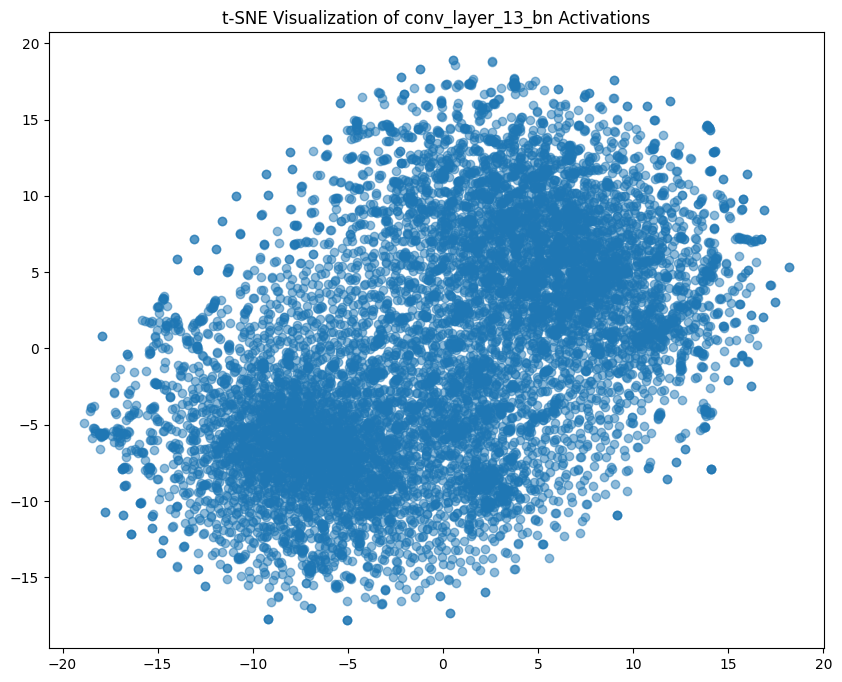

In [ ]:
visualize_tsne(model, val_loader, 'conv_layer_13_bn')

[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)
#Confusion Matrices
Both confusion matrices are plotted in the following code blocks.

In [ ]:
def plot_confusion_matrix(y_true, y_pred, classes, title='Confusion Matrix', cmap=plt.cm.Blues):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

Base Vgg-16

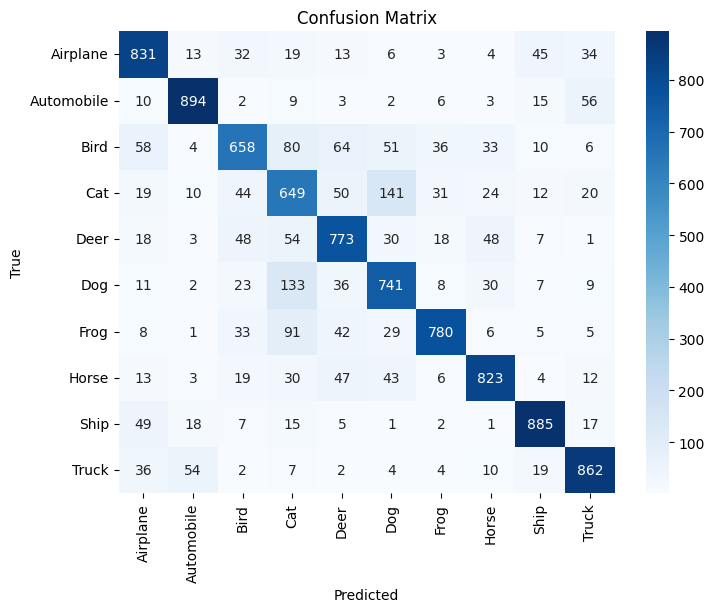

In [ ]:
y_true = []
y_pred = []

model.eval()
with torch.no_grad():
    for inputs, targets in val_loader:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = model(inputs)
        _, predicted = outputs.max(1)

        y_true.extend(targets.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())
cifar10_classes = ['Airplane', 'Automobile', 'Bird', 'Cat', 'Deer', 'Dog', 'Frog', 'Horse', 'Ship', 'Truck']

plot_confusion_matrix(y_true, y_pred, classes=cifar10_classes)


Residual Network

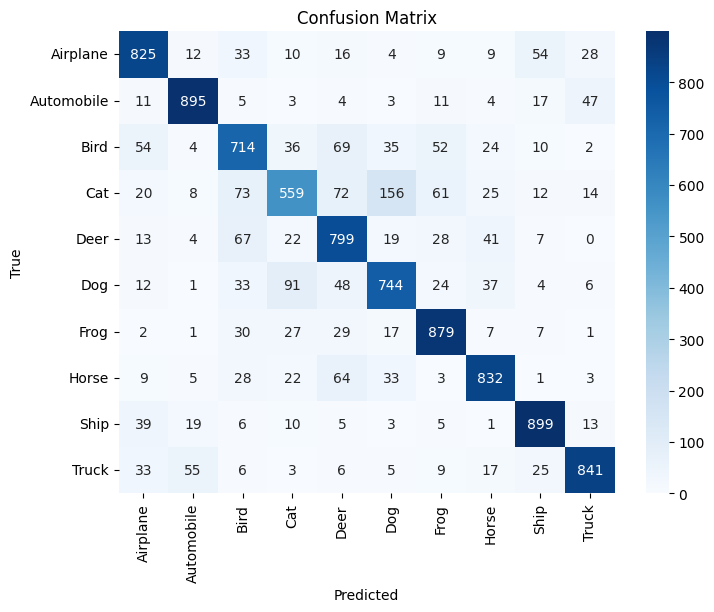

In [ ]:
model = VGG16plusresidual(
    activation_str=activation_str,
).to(device)

checkpoint_path = "/content/model_weights_epoch_withRes_25.pth"
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint)

# Set the model to evaluation mode
model.eval()

# Class names for CIFAR-10
cifar10_classes = ['Airplane', 'Automobile', 'Bird', 'Cat', 'Deer', 'Dog', 'Frog', 'Horse', 'Ship', 'Truck']

# Assuming you have a validation dataset
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, targets in val_loader:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = model(inputs)
        _, predicted = outputs.max(1)

        y_true.extend(targets.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

# Plot confusion matrix
plot_confusion_matrix(y_true, y_pred, classes=cifar10_classes)

[Back to Menu](#scrollTo=RmOz_nrqMQDC&line=12&uniqifier=1)
#Weight Variance Analysis
In order to identify how/if residual networks may help with the vanishing gradient problem, we have decided to monitor the weights of every convolutional layer of the model at epochs 5, 10, 15, 20, 25. By comparing the same weight at different epochs, we extract the average weight variance per layer for both models.

Loads the weight values from Google Drive

In [ ]:
drive.mount('/content/gdrive')
target_layers = ()

activation_str = "relu"
initialization = "xavier_normal"
train_accs, train_losses, val_accs, val_losses = [], [], [], []
n_epochs = 25
epoch_grads = []

weights = [[],[]]
models=[[],[]]

for j in range(5):
  models[0].append(VGG16( activation_str=activation_str,).to(device))
  models[1].append(VGG16plusresidual(activation_str=activation_str,).to(device))

cnn_paths = ['/content/gdrive/MyDrive/Models/model_weights_epoch_5.pth','/content/gdrive/MyDrive/Models/model_weights_epoch_10.pth', '/content/gdrive/MyDrive/Models/model_weights_epoch_15.pth', '/content/gdrive/MyDrive/Models/model_weights_epoch_20.pth', '/content/gdrive/MyDrive/Models/model_weights_epoch_25.pth']
res_paths = ['/content/gdrive/MyDrive/Models/model_weights_epoch_withRes_5.pth', '/content/gdrive/MyDrive/Models/model_weights_epoch_withRes_10.pth', '/content/gdrive/MyDrive/Models/model_weights_epoch_withRes_15.pth', '/content/gdrive/MyDrive/Models/model_weights_epoch_withRes_20.pth', '/content/gdrive/MyDrive/Models/model_weights_epoch_withRes_25.pth']
model_paths = [cnn_paths, res_paths]

for i in range(len(model_paths)):
  for j in range (len(model_paths[i])):
    pth = torch.load(model_paths[i][j])
    weights[i].append(pth)
    models[i][j].load_state_dict(pth)



Mounted at /content/gdrive


Computes the mean weight variance for every layer

In [ ]:
layernames = ['conv_layer_1.weight', 'conv_layer_2.weight', 'conv_layer_3.weight', 'conv_layer_4.weight', 'conv_layer_5.weight', 'conv_layer_6.weight', 'conv_layer_7.weight', 'conv_layer_8.weight', 'conv_layer_9.weight', 'conv_layer_10.weight', 'conv_layer_11.weight', 'conv_layer_12.weight', 'conv_layer_13.weight']
variances = np.empty((2, 13))

flats=[[[],[],[],[],[],[],[],[],[],[],[],[],[]], [[],[],[],[],[],[],[],[],[],[],[],[],[]]]
mus=[[], []]

for j in range (len(layernames)):
  print(f"Processing: {layernames[j]}")
  for i in range (len(models)):
    vals = [[],[],[],[],[]]
    for k in range(len(models[i])):
      for name, param in models[i][k].named_parameters():
        if name == layernames[j]:
          flt = param.view(-1)
          for v in flt:
            vals[k].append(v.item())
    mus[i].append(np.mean(np.var(vals)))


Processing: conv_layer_1.weight
Processing: conv_layer_2.weight
Processing: conv_layer_3.weight
Processing: conv_layer_4.weight
Processing: conv_layer_5.weight
Processing: conv_layer_6.weight
Processing: conv_layer_7.weight
Processing: conv_layer_8.weight
Processing: conv_layer_9.weight
Processing: conv_layer_10.weight
Processing: conv_layer_11.weight
Processing: conv_layer_12.weight
Processing: conv_layer_13.weight


Plots for every layer, the mean weight variance of the residual network over the mean variance of the base Vgg-16. Results show a spike in comparative layer variance at the first layer, which is insufficient to prove the presence of vanishing gradients, but a decent confirmation of the direction of our research.

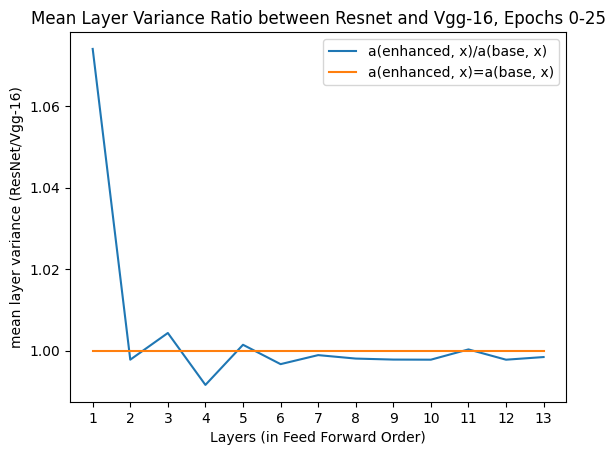

In [ ]:
layers = ["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12", "13"]

ratios = []
for i in range(len(mus[0])):
  ratios.append(mus[1][i]/mus[0][i])
one = [1.0]*13

plt.xlabel("Layers (in Feed Forward Order)")
plt.ylabel("mean layer variance (ResNet/Vgg-16)")
plt.title("Mean Layer Variance Ratio between Resnet and Vgg-16, Epochs 0-25")
plt.plot(layers, ratios, label="a(enhanced, x)/a(base, x)")
plt.plot(layers, one, label="a(enhanced, x)=a(base, x)")
plt.legend()
plt.show()